In [ ]:
#pip install tensorflow

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.image import pad_to_bounding_box
from tensorflow.image import central_crop
from tensorflow.image import resize

In [4]:
bgd = image.load_img('dogs.png')

In [6]:
image.img_to_array(bgd).shape #높이, 너비, 채널(컬러는3 흑백은1) RGB(3)

(1157, 1148, 3)

In [7]:
bgd_vector = np.asarray(image.img_to_array(bgd))

In [8]:
bgd_vector = bgd_vector/255 #이미지를 정규화

#정규화 - 데이터의 범위가 차이가 많이있을때 공통된 범위로 해줌 0~1
#표준화 - 평균이 0, 표준편차 1이 되도록 만들어주는것

In [ ]:
# 정규화: 정규성이 없는 데이터들 0 ~ 1 사이 값으로 해주겠다
# 표준화: 특정 정규분표를 띄는경우에...

In [ ]:
# 표준화
# 몸무게 평균:60, 최대값: 70 (2시그마)
# 일반인: 30 (-4시그마)
# #몸무게의 경우 정규화해주면은 단순히 30키로는0 70키로는1로되고 평균으로부터 얼마만큼 차이가나는지
# #알수가없으므로 표준화를 해줘서 디테일한 설계가 가능하다

In [9]:
bgd_vector.shape

(1157, 1148, 3)

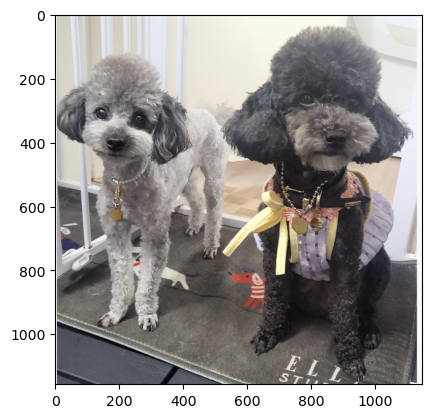

In [10]:
plt.imshow(bgd_vector)
plt.show()

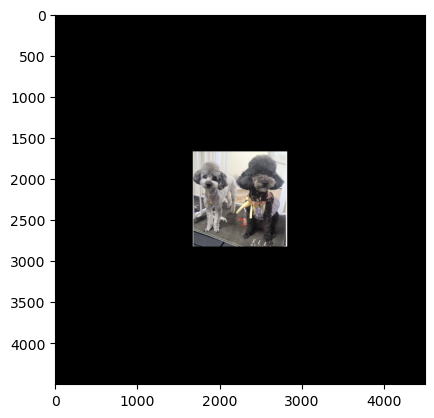

In [11]:
#이미지의 변경할 크기 설정 
target_height = 4500
target_width = 4500
 
#현재 이미지의 크기 지정 
source_height = bgd_vector.shape[0]
source_width = bgd_vector.shape[1]
 
#padding 실시 : pad_to_bounding_box 사용 
bgd_vector_pad = pad_to_bounding_box(bgd_vector, 
                                     int((target_height-source_height)/2), 
                                     int((target_width-source_width)/2), 
                                     target_height, 
                                     target_width)
  #이미지의 바탕검은색 부분이bounding_box                                   
 #이미지 형태 확인 
bgd_vector_pad.shape
 
#이미지 확인 
plt.imshow(bgd_vector_pad)
plt.show()

#이미지 저장 
image.save_img('dogs_pad.png', bgd_vector_pad)

In [12]:
bgd_vector_pad.shape

TensorShape([4500, 4500, 3])

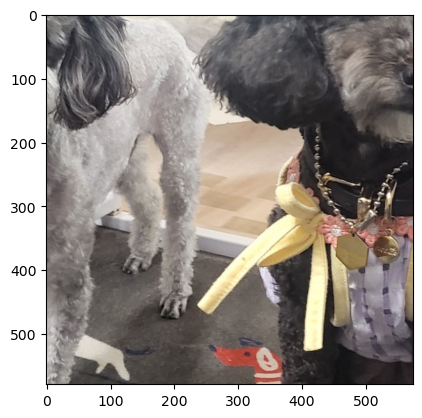

In [13]:
#가운데를 중심으로 50%만 crop 
bgd_vector_crop = central_crop(bgd_vector, .5)#.5 = 50%만추출
 
bgd_vector_crop.shape
 
plt.imshow(bgd_vector_crop)
plt.show()

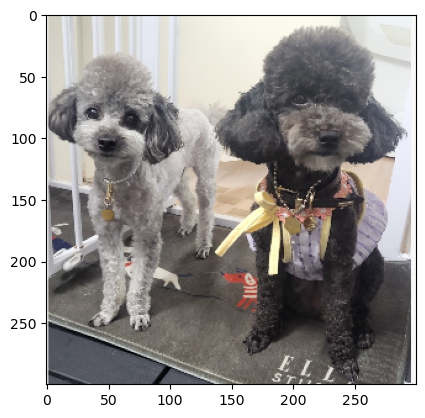

In [14]:
bgd_vector_resize = resize(bgd_vector, (300,300)) #resize 크기조절
 
bgd_vector_resize.shape
 
plt.imshow(bgd_vector_resize)

In [15]:
#사전학습 모델 불러오기 : 케라스에서 클래스 형태로 제공함 
from tensorflow.keras.applications.vgg16 import VGG16

# from tensorflow.keras.applications. #.까지하고 탭 
# 사전학습된 우수한 이미지 분류 모델들 많다 우린 그중에VGG16 가져와봄

#weight, include_top 파라미터 설정 
model = VGG16(weights='imagenet', include_top=True)
model.summary()

553467096/553467096 [==============================] - 73s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                           

In [16]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
 
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.applications.imagenet_utils import preprocess_input
import numpy as np
 
img = Image.open('dogs.png')

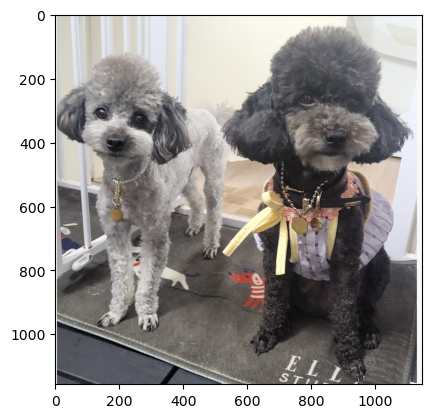

In [18]:
#img
plt.imshow(np.asarray(img))

In [19]:
img.size

(1148, 1157)

In [20]:
w, h = img.size # 1148이 w에 1157이 h에 들어감
s = min(w, h) 작은값이 s에

In [21]:
y = (h - s) // 2
x = (w - s) // 2

In [22]:
y

4

In [23]:
print(w, h, x, y, s)

1148 1157 0 4 1148


In [24]:
img = img.crop((x, y, x+s, y+s)) #crop함수는 이미지의 일부분을 잘라낼때 (크기 동일하게 맞추려고)

In [25]:
img.size

(1148, 1148)

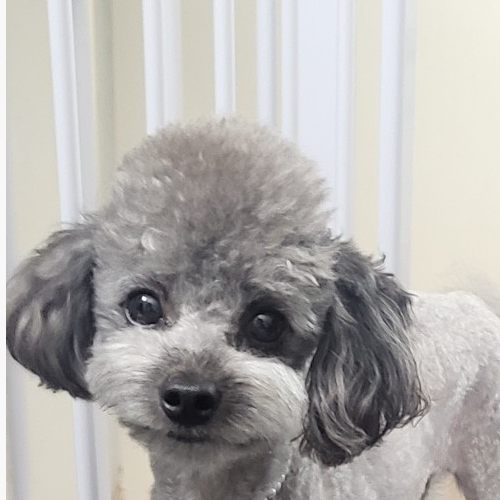

In [26]:
img.crop((0,0,500,500))#이미지의 좌측상단부터 500,500까지 자름

In [28]:
model.layers[0].input_shape #모델의 이미지 크기이다 여기에 맞춰줘야 모델적용됨

[(None, 224, 224, 3)]

In [29]:
target_size = 224 #이미지넷 모델 권장크기로 변경해줌
img = img.resize((target_size, target_size))

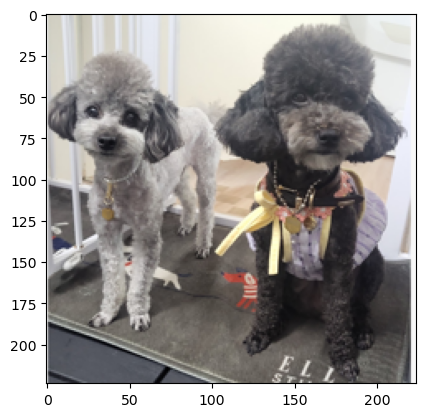

In [30]:
plt.imshow(np.asarray(img))

In [31]:
np_img = image.img_to_array(img)
np_img.shape  #(224, 224, 3)

(224, 224, 3)

In [32]:
img_batch = np.expand_dims(np_img, axis=0) #차원을 늘려줌expand_dims차원추가할때 함수
img_batch.shape #가장앞 1이 이미지 개수 

(1, 224, 224, 3)

In [33]:
pre_processed = preprocess_input(img_batch) #사전학습된 모델안에있는 전처리된 기능 그냥쓰면됨

In [34]:
y_preds = model.predict(pre_processed)
 
y_preds.shape  # 종속변수가 취할 수 있는 값의 수 = 1000
 
np.set_printoptions(suppress=True, precision=10)
y_preds #예측값들이 담겨있다 0번부터~999번까지(1000개)
 
#가장 확률이 높은 값
np.max(y_preds)

1/1 [==============================] - 1s 728ms/step


0.78416103

In [77]:
y_preds.sum()

1.0000001

In [37]:
np.sum(y_preds)#소프트맥스 적용 다 더하면 1이나온다, 확률

1.0000001

In [38]:
decode_predictions(y_preds, top=10)

[[('n02113624', 'toy_poodle', 0.78416103),
  ('n02113712', 'miniature_poodle', 0.16782114),
  ('n02096437', 'Dandie_Dinmont', 0.01923898),
  ('n02093647', 'Bedlington_terrier', 0.016176438),
  ('n02113799', 'standard_poodle', 0.012043098),
  ('n02097047', 'miniature_schnauzer', 8.5362444e-05),
  ('n02105641', 'Old_English_sheepdog', 8.354024e-05),
  ('n02086240', 'Shih-Tzu', 7.7943914e-05),
  ('n02085936', 'Maltese_dog', 1.9853807e-05),
  ('n02106382', 'Bouvier_des_Flandres', 1.9203428e-05)]]

In [39]:
decode_predictions(y_preds, top=10)

[[('n02113624', 'toy_poodle', 0.78416103),
  ('n02113712', 'miniature_poodle', 0.16782114),
  ('n02096437', 'Dandie_Dinmont', 0.01923898),
  ('n02093647', 'Bedlington_terrier', 0.016176438),
  ('n02113799', 'standard_poodle', 0.012043098),
  ('n02097047', 'miniature_schnauzer', 8.5362444e-05),
  ('n02105641', 'Old_English_sheepdog', 8.354024e-05),
  ('n02086240', 'Shih-Tzu', 7.7943914e-05),
  ('n02085936', 'Maltese_dog', 1.9853807e-05),
  ('n02106382', 'Bouvier_des_Flandres', 1.9203428e-05)]]

In [ ]:
# 부족한이미지 대체하기위해서 이미지증식

In [40]:
image = Image.open('dogs.png').resize((500, 400)) #크기를 동일하게 해줘야해서 리사이즈 해줘야한다

In [41]:
image_tensor = tf.keras.preprocessing.image.img_to_array(image) #이미지를 어레이로 변환

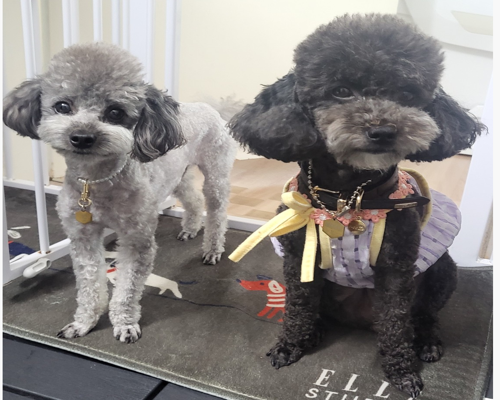

In [42]:
image

In [45]:
image_tensor.shape

(400, 500, 3)

In [ ]:
# # train = 20명 * 10장 이미지(대한민국) 
# # test = 20명 * 3장 이미지(대한민국)
# # 번호 부여 : 0번~20번 -> 원핫인코딩
# # 100000000000000000000
# # ...
# # 000000000000000000001

# 이미지 증식(가능하면)
# - 성능 비교
# - 다양한 증식
# - 증식된 파일 저장
# ex) train = 20명 * 10장 = 200장
# 1장당 회전/반전/. . . => 5장으로 증식 #트레인 데이터만 증식 테스트데이터는 손대면안됨
# 5*200 = 1000장
# 1000장 -> cnn -> 모델 -> test 진행 -> 정확도
# 카페에 업로드 : 정확도 기재

# 파일이름 ex) 황용하 : train_140.jpg ~ train_149.jpg
# test_042.jpg~test_044..jpg
# (200, 500, 150, 3) 트레인데이터200장
# xtrain = (200, 500, 150, 3)
# ytrain = (200,20)
# xtest=(60,500,150,3)
# ytest=(60,20)
# xtrain, ytrain data 구성 -> CNN 모델 -> xtest -> yred 와 ytest를 비교하여 성능 출력
# 그림판에 대한민국  이미지를 13장 생성한다
# 크기는 500,150으로 한다
# 혹시 크기가 좀 다르더라도 image resize(500,150)으로 하면 크기 조절 됨
# cnn모델 생성 -> validation 데이터 없이 실행

In [ ]:
# Flip. 반전

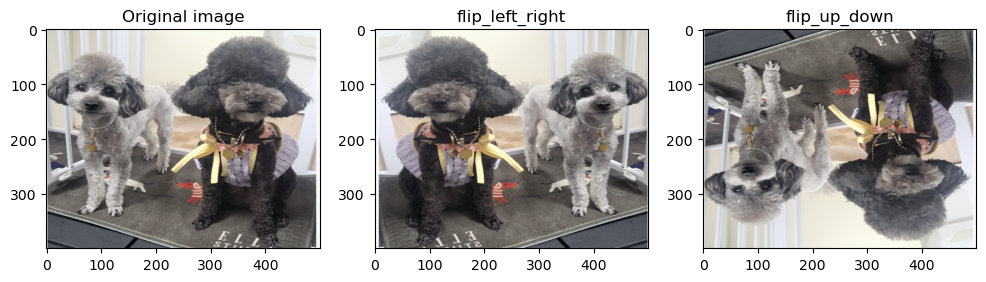

In [46]:
flip_lr_tensor = tf.image.flip_left_right(image_tensor)
flip_ud_tensor = tf.image.flip_up_down(image_tensor)
flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)


plt.figure(figsize=(12,12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

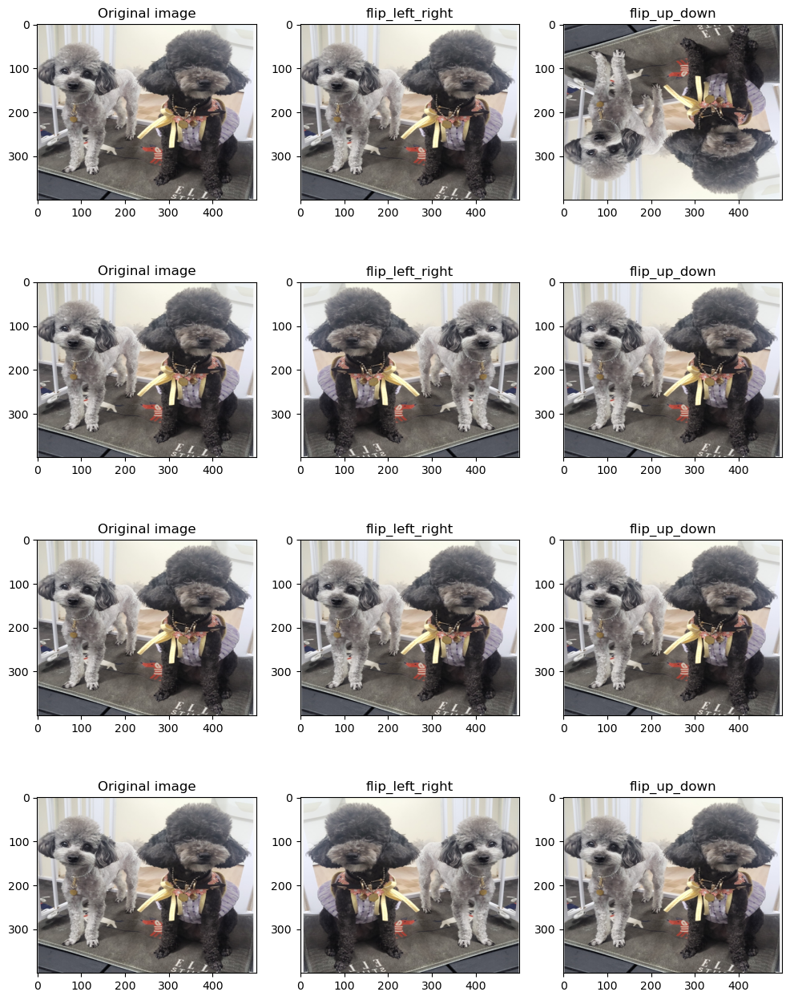

In [49]:
plt.figure(figsize=(12,16))

row = 4
for i in range(row):
  flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
  flip_ud_tensor = tf.image.random_flip_up_down(image_tensor)
  flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
  flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

  plt.subplot(4,3, i*3+1)
  plt.title('Original image')
  plt.imshow(image)

  plt.subplot(4,3,i*3+2)
  plt.title('flip_left_right')
  plt.imshow(flip_lr_image)

  plt.subplot(4,3,i*3+3)
  plt.title('flip_up_down')
  plt.imshow(flip_ud_image)

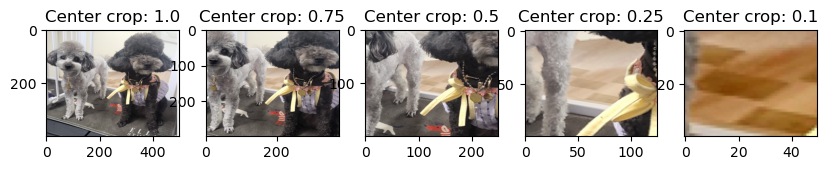

In [50]:
plt.figure(figsize=(12,15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1] #가운데 중심으로 확대 
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
  cropped_tensor = tf.image.central_crop(image_tensor, frac)
  cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)

  plt.subplot(1, col+1, i+1)
  plt.title(f'Center crop: {frac}')
  plt.imshow(cropped_img)

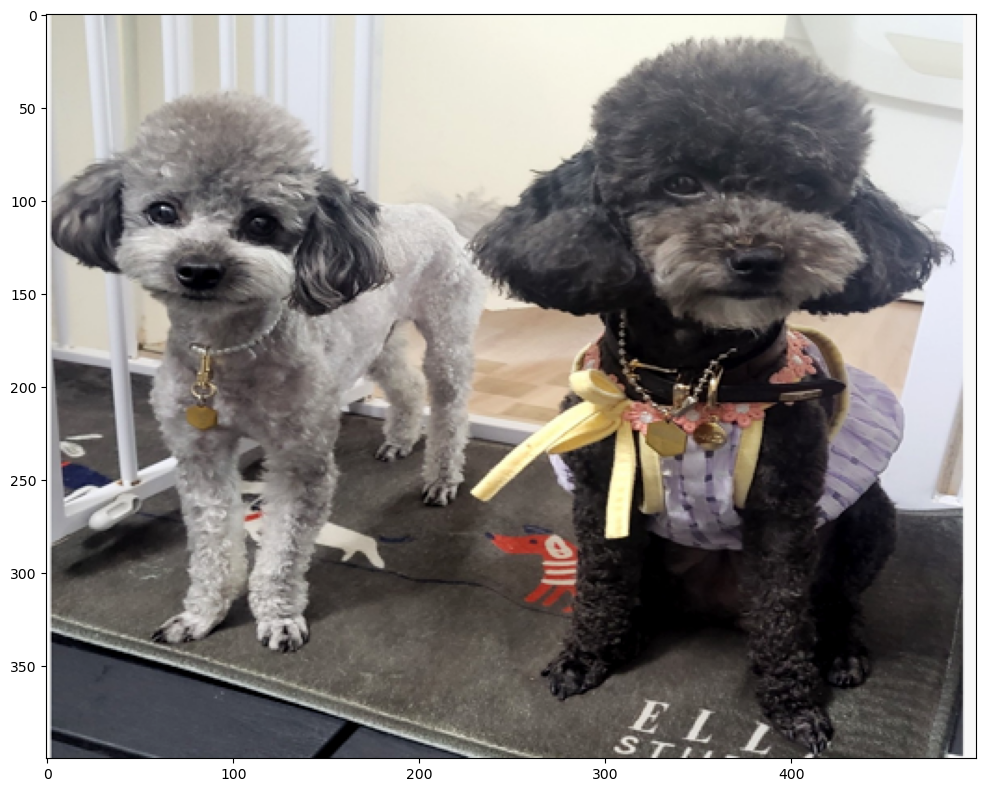

In [54]:
plt.figure(figsize=(12, 15))

random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

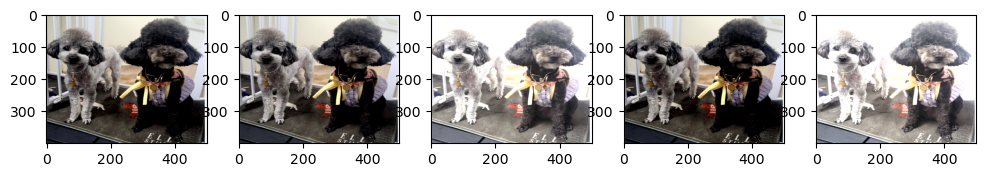

In [65]:
plt.figure(figsize=(12,15))

for i in range(5):
  random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=100) #max_delta밝기..
  random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
  random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

  plt.subplot(1, 5, i+1)
  plt.imshow(random_bright_image)

In [66]:
pip install albumentations

   ---------------------------------------- 0.0/125.7 kB ? eta -:--:--
   ---------------------------------------  122.9/125.7 kB ? eta -:--:--
   ---------------------------------------- 125.7/125.7 kB 2.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/38.0 MB ? eta -:--:--
   --- ------------------------------------ 2.9/38.0 MB 60.8 MB/s eta 0:00:01
   ----- ---------------------------------- 5.5/38.0 MB 70.0 MB/s eta 0:00:01
   -------- ------------------------------- 8.3/38.0 MB 76.0 MB/s eta 0:00:01
   ----------- ---------------------------- 11.3/38.0 MB 73.1 MB/s eta 0:00:01
   -------------- ------------------------- 14.2/38.0 MB 73.1 MB/s eta 0:00:01
   ------------------ --------------------- 17.6/38.0 MB 81.8 MB/s eta 0:00:01
   --------------------- ------------------ 20.9/38.0 MB 81.8 MB/s eta 0:00:01
   ----------------------- ---------------- 22.0/38.0 MB 81.8 MB/s eta 0:00:01
   ------------------------ --------------- 23.5/38.0 MB 65.6 MB/s eta 0:00:0

In [70]:
import numpy as np
image = Image.open('dogs.png').resize((400, 300)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

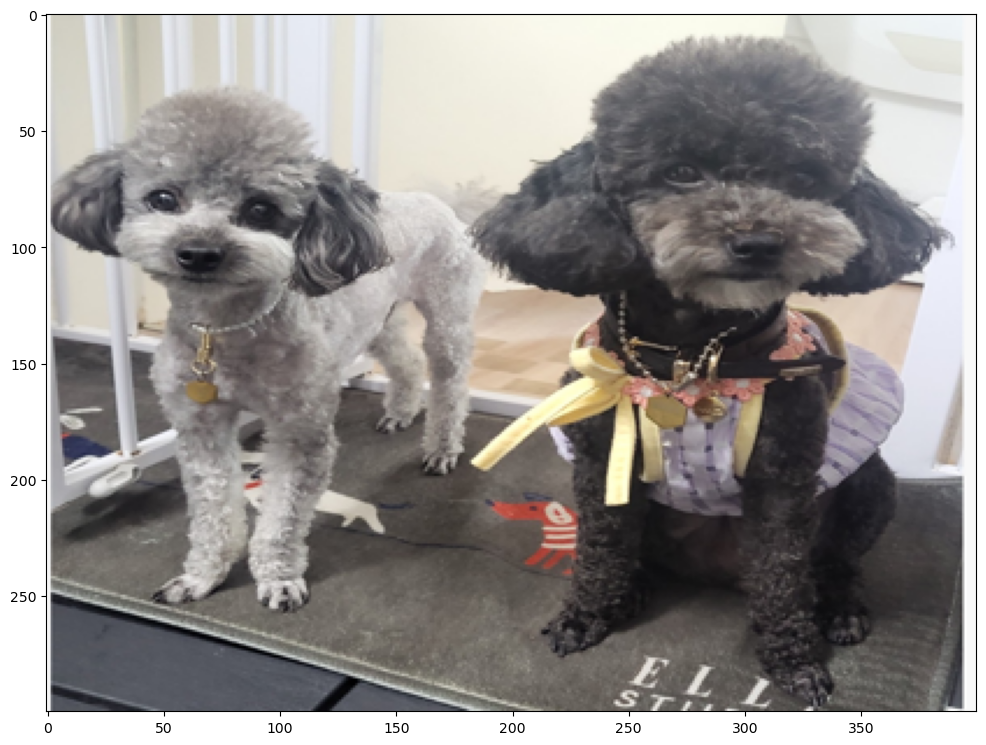

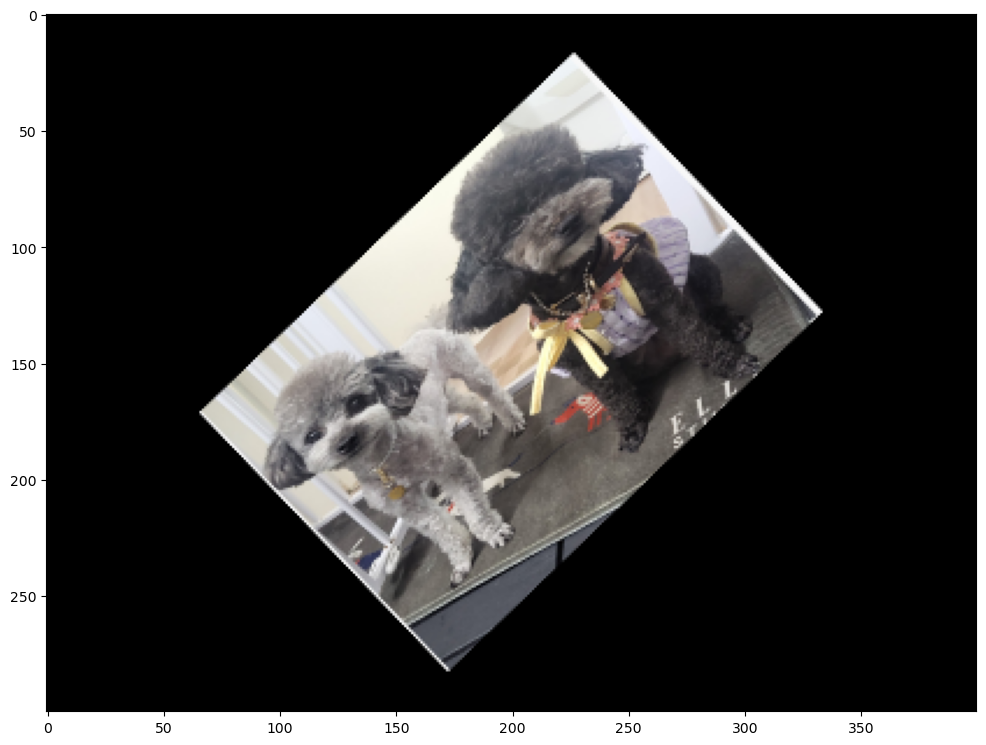

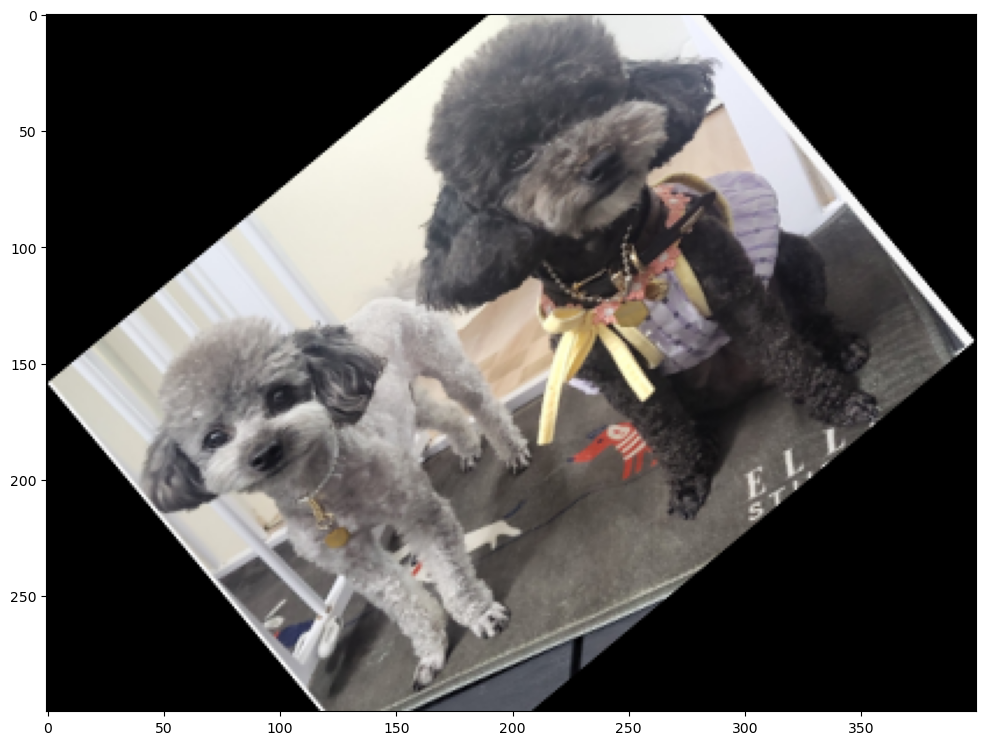

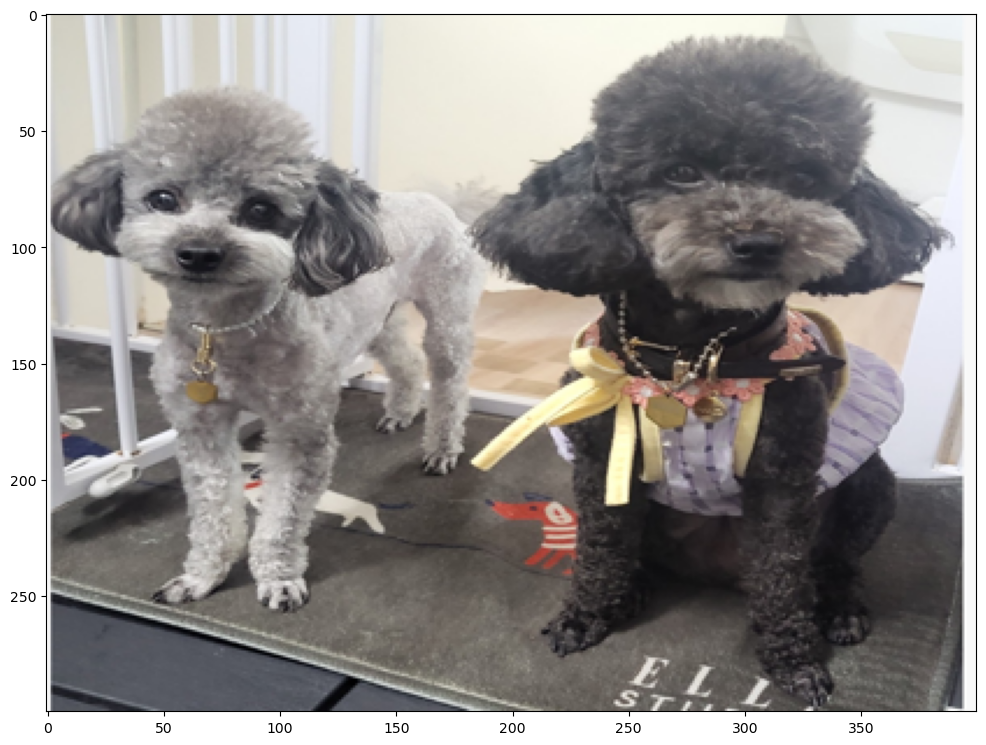

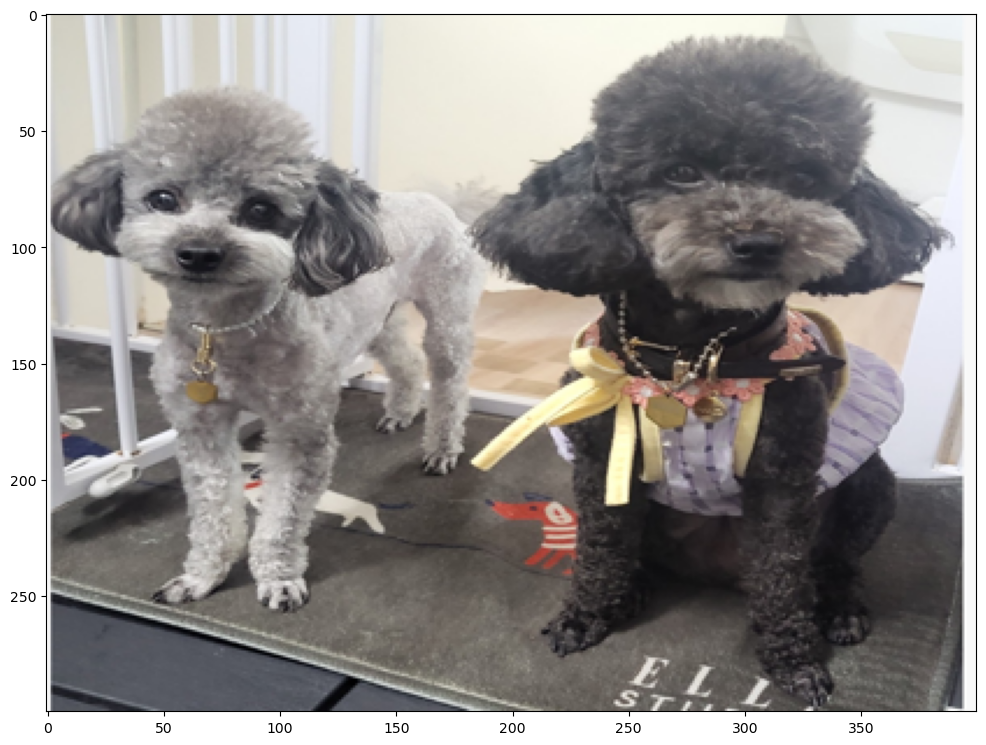

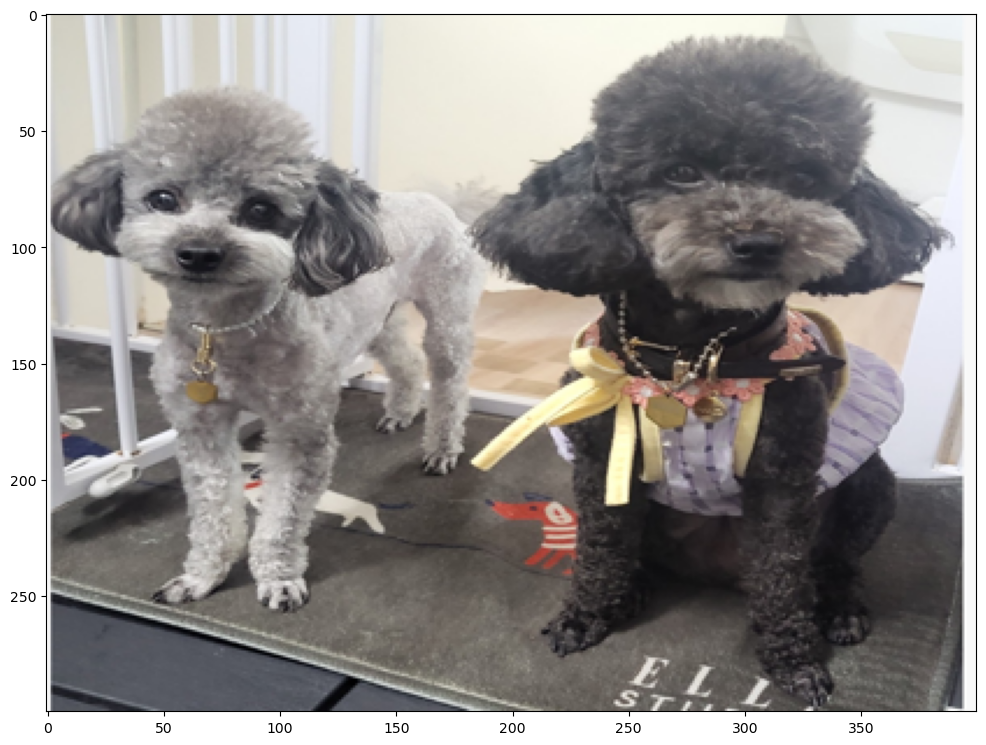

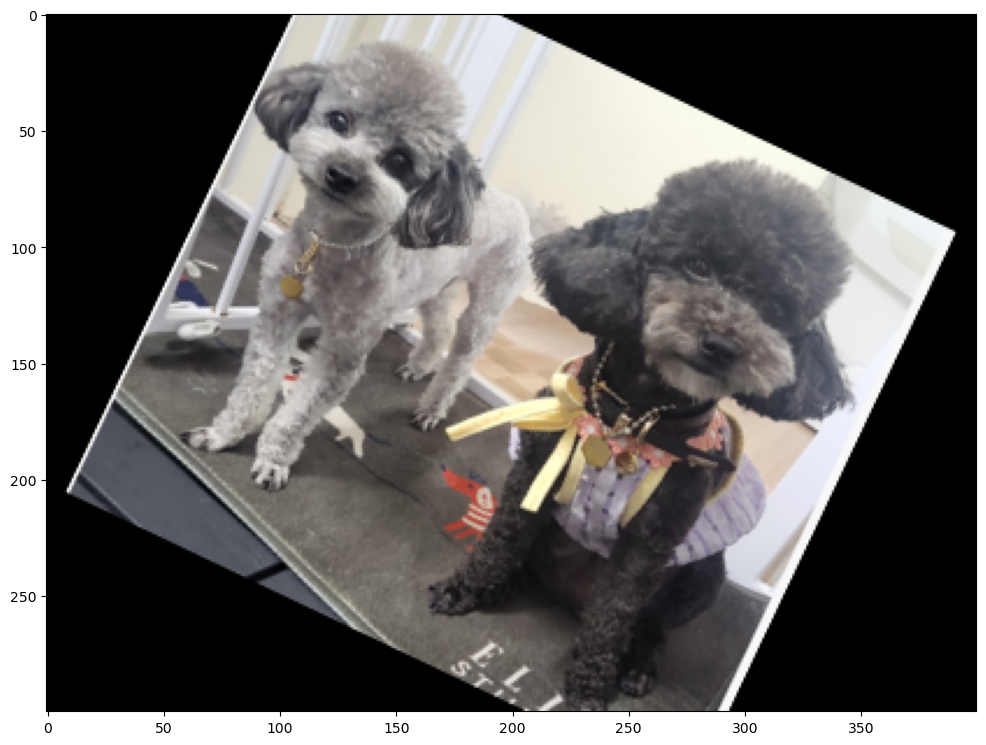

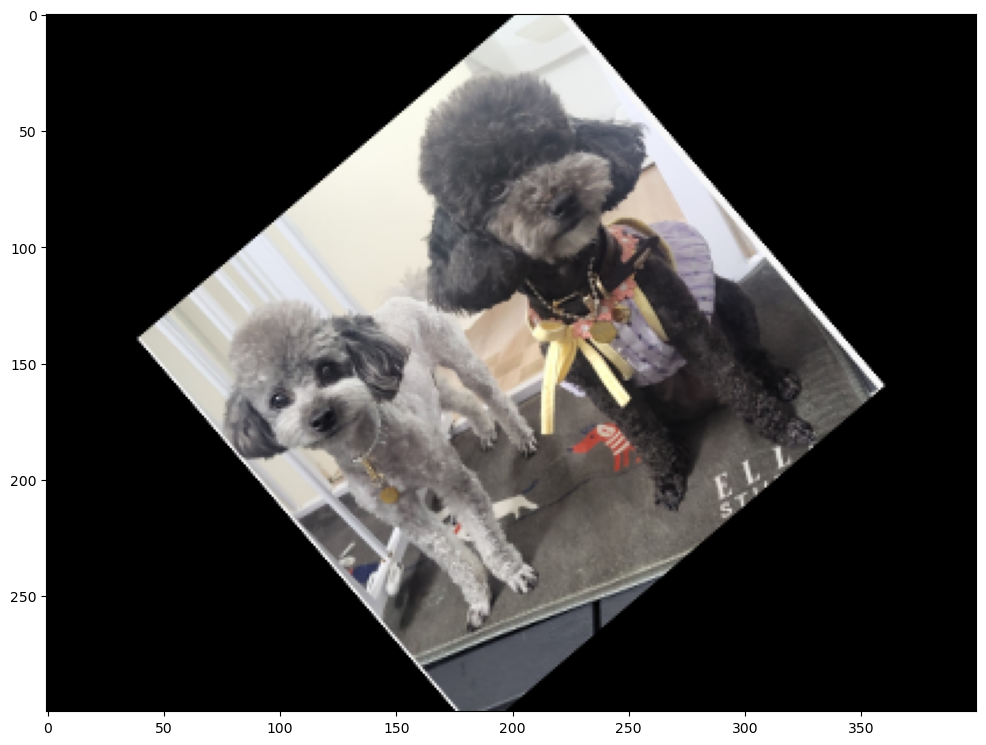

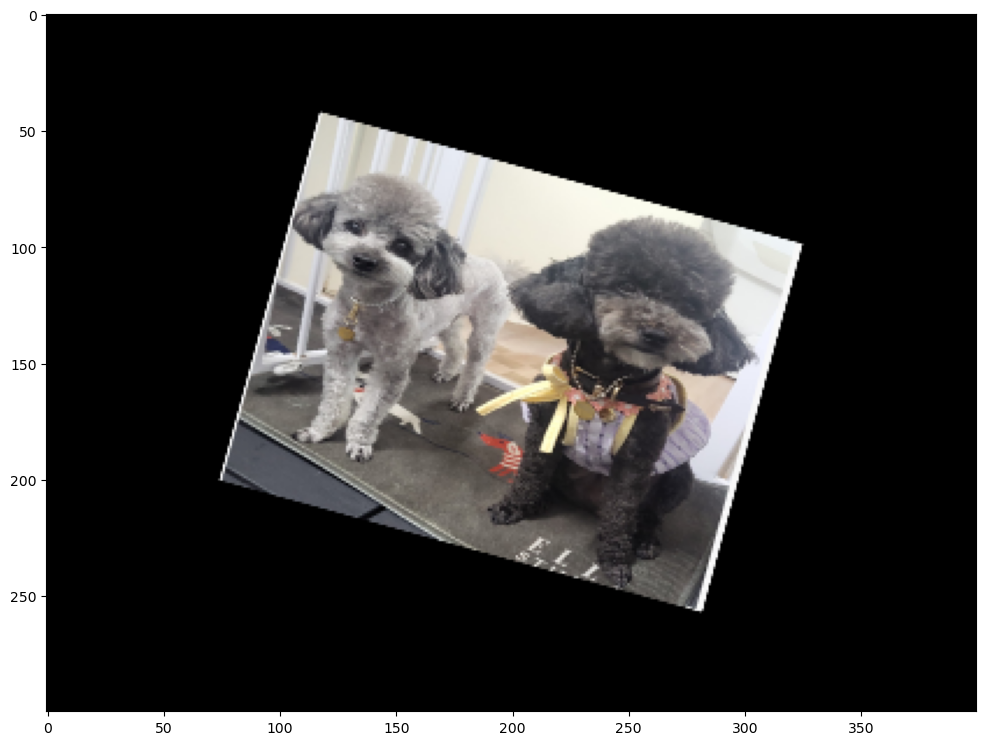

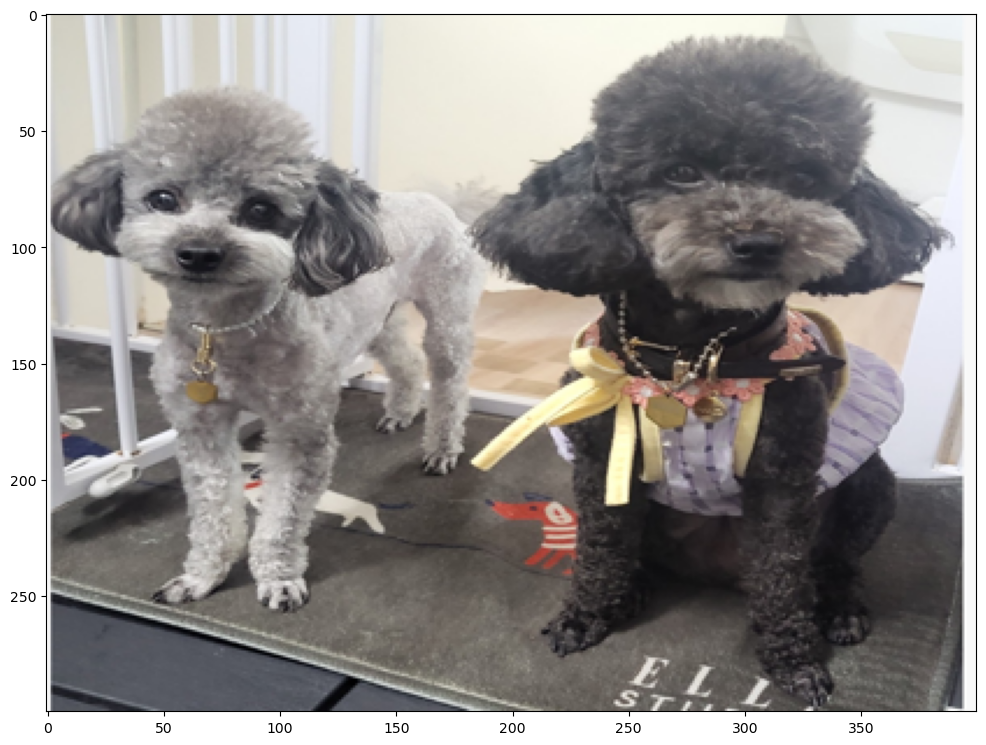

In [71]:
import albumentations as A #여러각도로 바꿔줌

for i in range(10):
    transform = A.Compose([
      A.Affine(rotate=(-45,45), scale=(0.5,0.9), p=0.5)
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()

In [ ]:
"""

"""

In [73]:
for i in range(140,150):
    img=Image.open(f'C:/Users/user/Desktop/손글씨/train_{i}.jpg')
    img.resize((500, 150)).save('C:/Users/user/Desktop/손글씨/train_{i}.jpg')

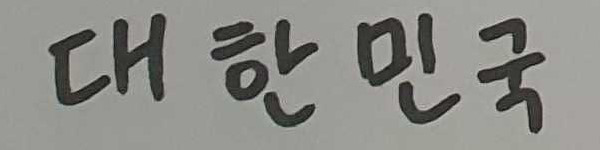

In [74]:
img